In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [23]:
img_paths = ["cat.4001.jpg"]

## Read Image

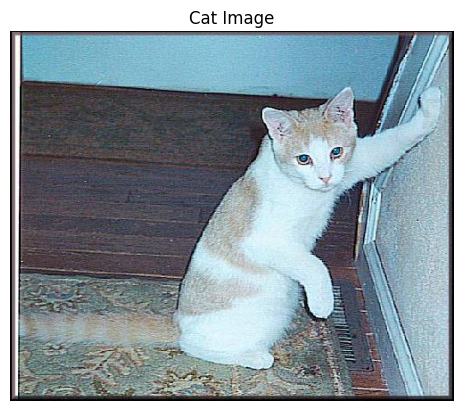

In [24]:
img = cv.imread(img_paths[0])
# BGR to RGB
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.imshow(img)
plt.title("Cat Image")
plt.axis("off")
plt.show()

## RGB to Grayscale

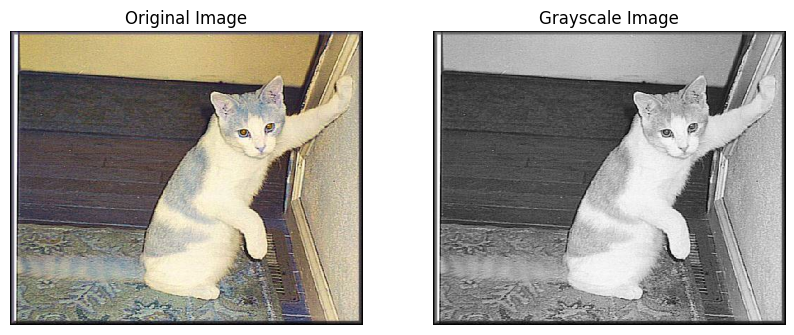

In [25]:
img = cv.imread(img_paths[0])

# convert to grayscale
gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(img)
axs[0].set_title('Original Image')
axs[1].imshow(gray_img, cmap='gray')
axs[1].set_title('Grayscale Image')
axs[0].axis('off')
axs[1].axis('off')

plt.show()

## Image Masking

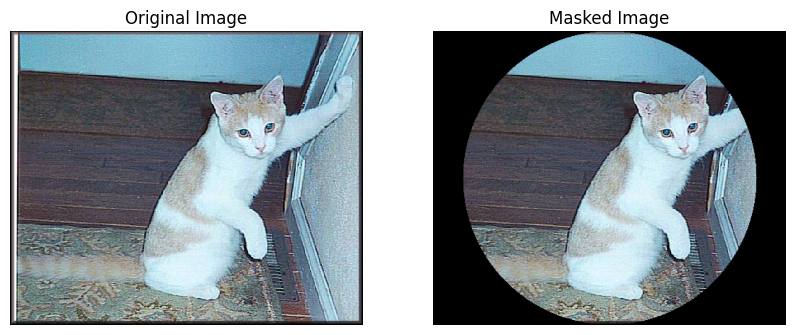

In [26]:
img = cv.imread(img_paths[0])

# create a black mask with the same size as the image
mask = np.zeros_like(img)

# define the center and the radius of the circle
height, width = img.shape[:2]
center = (width // 2, height // 2)
radius = min(center[0], center[1])

# draw a white circle in the mask
cv.circle(mask, center, radius, (255, 255, 255), -1)

# apply mask to the image
masked_image = cv.bitwise_and(img, mask)

# display the masked image
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[1].imshow(cv.cvtColor(masked_image, cv.COLOR_BGR2RGB))
ax[1].set_title('Masked Image')
ax[0].axis('off')
ax[1].axis('off')
plt.show()



## Image Color Channel

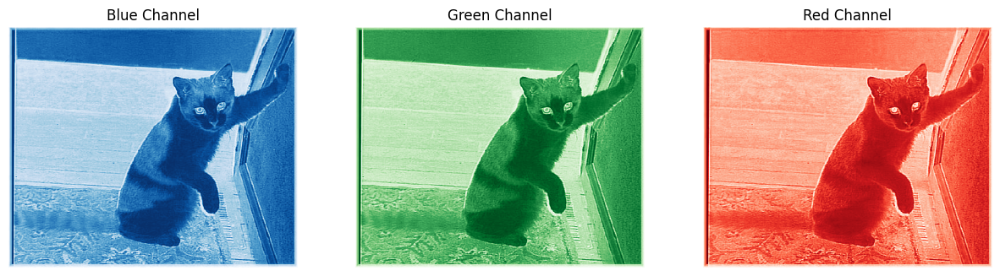

In [27]:
img = cv.imread(img_paths[0])

# split the image into its color channels
b, g, r = cv.split(img)

# display each color channel as a separate image
fig, ax = plt.subplots(1, 3, figsize=(15, 8))
ax[0].imshow(b, cmap="Blues")
ax[0].set_title("Blue Channel")
ax[1].imshow(g, cmap="Greens")
ax[1].set_title("Green Channel")
ax[2].imshow(r, cmap="Reds")
ax[2].set_title("Red Channel")
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")
plt.show()

## Mergin Images

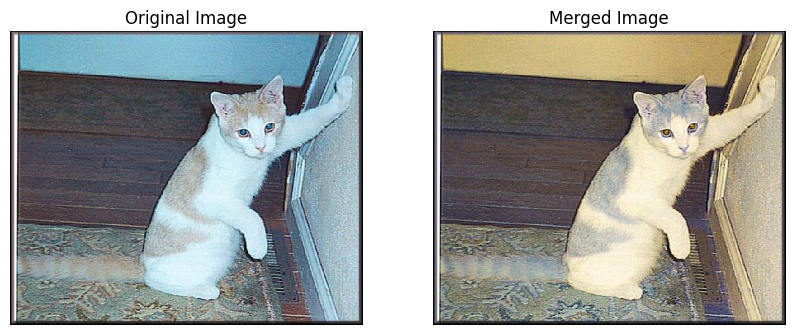

In [28]:
img = cv.imread(img_paths[0])

b, g, r = cv.split(img)

# merge the color channels back into an image
merged_img = cv.merge([r, g, b])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax1.set_title("Original Image")
ax2.imshow(cv.cvtColor(merged_img, cv.COLOR_BGR2RGB))
ax2.set_title("Merged Image")
ax1.axis("off")
ax2.axis("off")
plt.show()

## Grayscale Histogram

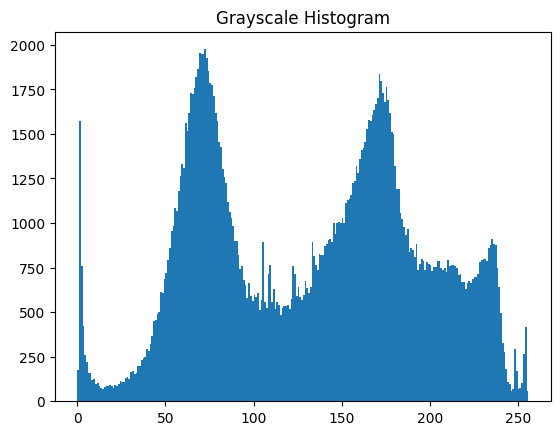

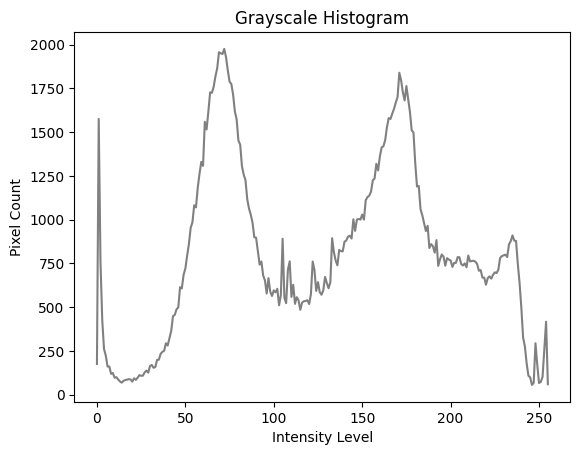

In [29]:
img = cv.imread(img_paths[0])

# plot the histogram of a grayscale image
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

plt.hist(gray_img.ravel(), 256, [0, 256])
plt.title("Grayscale Histogram")
plt.show()

# calculate the grayscale histogram using cv.calcHist()
hist = cv.calcHist([gray_img], [0], None, [256], [0, 256])

plt.plot(hist, color="gray")
plt.xlabel("Intensity Level")
plt.ylabel("Pixel Count")
plt.title("Grayscale Histogram")
plt.show()

## Color Histogram

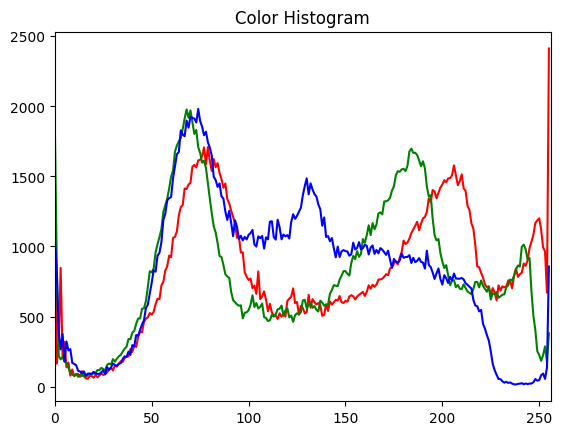

In [30]:
color_img = cv.imread(img_paths[0])

colors = ("r", "g", "b")
for i, color in enumerate(colors):
    hist = cv.calcHist([color_img], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
    plt.xlim([0, 256])

plt.title("Color Histogram")
plt.show()


# Histogram Equalization

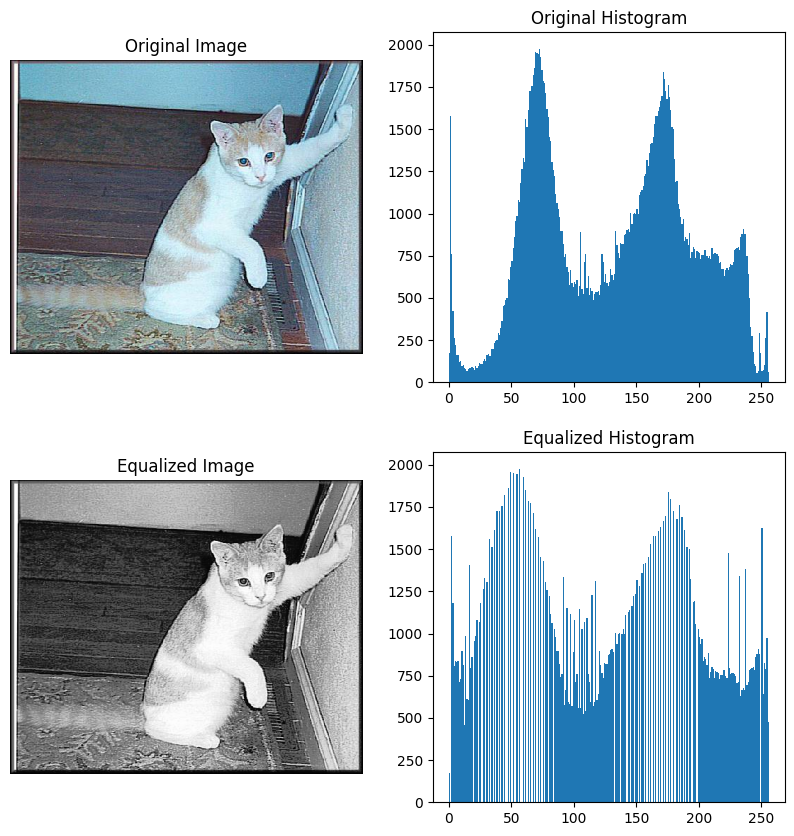

In [31]:
img = cv.imread(img_paths[0])
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

# Perform histogram equalization on the grayscale image
eq_gray_img = cv.equalizeHist(gray_img)

# Plot the images and histograms
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(img)
axs[0, 0].set_title('Original Image')

axs[0, 1].hist(gray_img.ravel(), 256, [0, 256])
axs[0, 1].set_title('Original Histogram')

axs[1, 0].imshow(eq_gray_img, cmap='gray')
axs[1, 0].set_title('Equalized Image')

axs[1, 1].hist(eq_gray_img.ravel(), 256, [0, 256])
axs[1, 1].set_title('Equalized Histogram')
axs[0, 0].axis('off')
axs[1, 0].axis('off')
plt.show()


## Image Blurring

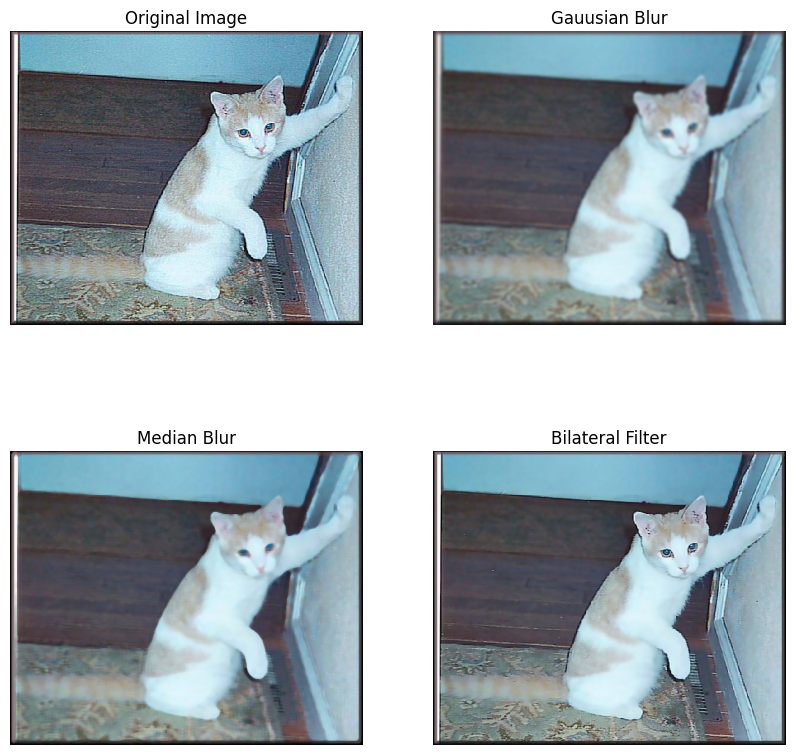

In [32]:
img = cv.imread(img_paths[0])

# create a figure to display the images
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# display the original image
axs[0, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0, 0].set_title("Original Image")

# Apply a Gaussian blur to the image
gaussian_blur = cv.GaussianBlur(img, (11, 11), 0)
axs[0, 1].imshow(cv.cvtColor(gaussian_blur, cv.COLOR_BGR2RGB))
axs[0, 1].set_title("Gauusian Blur")

# Apply median blur to the image
median_blur = cv.medianBlur(img, 7)
axs[1, 0].imshow(cv.cvtColor(median_blur, cv.COLOR_BGR2RGB))
axs[1, 0].set_title("Median Blur")

# Apply a bilateral filter to the image
bilateral_filter = cv.bilateralFilter(img, 9, 75, 75)
axs[1, 1].imshow(cv.cvtColor(bilateral_filter, cv.COLOR_BGR2RGB))
axs[1, 1].set_title('Bilateral Filter')
axs[0, 0].axis('off')
axs[0, 1].axis('off')
axs[1, 0].axis('off')
axs[1, 1].axis('off')
plt.show()


## Thresholding Image

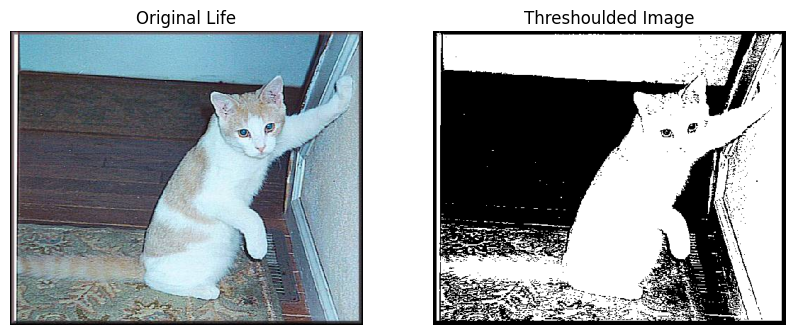

In [33]:
img = cv.imread(img_paths[0])

gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply thresholding using 127 as value
ret, thresh = cv.threshold(gray_img, 127, 255, cv.THRESH_BINARY)

fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title("Original Life")
axs[1].imshow(thresh, cmap="gray")
axs[1].set_title("Threshoulded Image")
axs[0].axis("off")
axs[1].axis("off")
plt.show()


## Image Gradient Detection

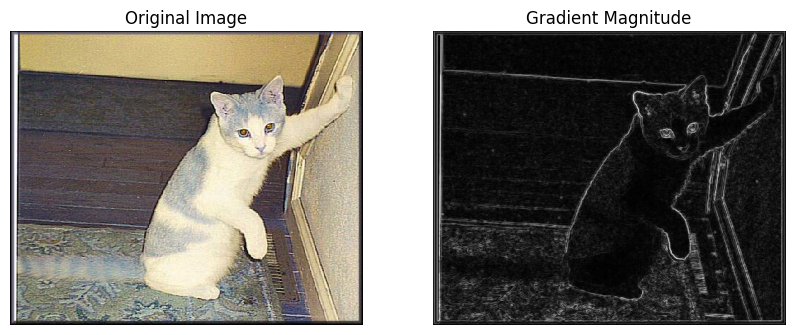

In [34]:
img = cv.imread(img_paths[0])

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Computing the gradient in the x and y direction using the Scharr operator
sobel_x = cv.Scharr(gray, cv.CV_64F, 1, 0)
sobel_y = cv.Scharr(gray, cv.CV_64F, 0, 1)

gradient_magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

# Normalizing the gradient magnitude to the range [0, 255]
normalized_gm = cv.normalize(gradient_magnitude, None, 0, 255,
                             cv.NORM_MINMAX, cv.CV_8U)

# Displaying the results
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(img)
axs[0].set_title("Original Image")
axs[1].imshow(normalized_gm, cmap="gray")
axs[1].set_title("Gradient Magnitude")
axs[0].axis("off")
axs[1].axis("off")
plt.show()



## Canny Edge Detection

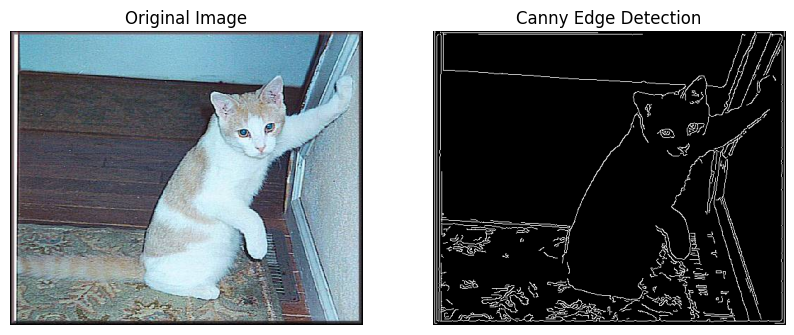

In [35]:
img = cv.imread(img_paths[0])
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv.GaussianBlur(gray, (5, 5), 0)

# Apply Canny Edge Detection
edges = cv.Canny(blurred, 100, 200)

fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title('Original Image')
axs[1].imshow(edges, cmap='gray')
axs[1].set_title('Canny Edge Detection')
axs[0].axis('off')
axs[1].axis('off')
plt.show()

## Image with Contours

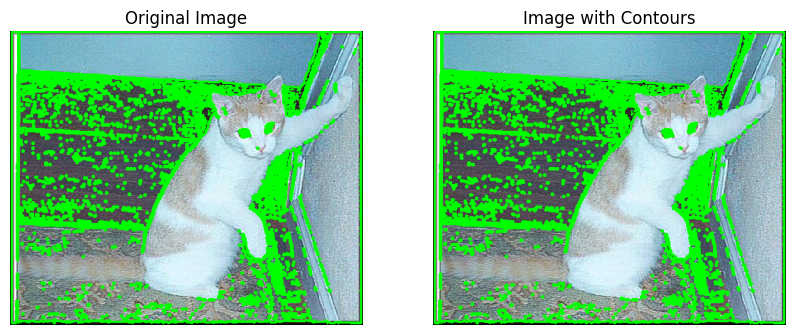

In [36]:
img = cv.imread(img_paths[0])
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply thresholding to obtain a binary image
_, binary = cv.threshold(gray, 50, 255, cv.THRESH_BINARY)

# Find the contours in the binary image
contours, hierarchy = cv.findContours(binary, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# Draw the contours of the original image
img_contours = cv.drawContours(img, contours, -1, (0, 255, 0), 2)

# display
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title("Original Image")
axs[1].imshow(cv.cvtColor(img_contours, cv.COLOR_BGR2RGB))
axs[1].set_title("Image with Contours")
axs[0].axis('off')
axs[1].axis('off')
plt.show()

## Image Transformation

### Rotation

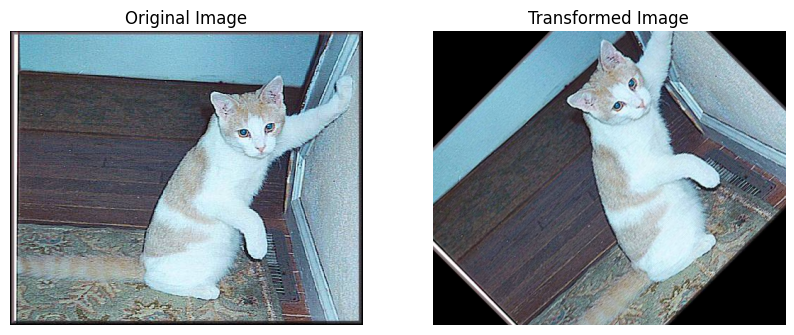

In [37]:
img = cv.imread(img_paths[0])

# Define the transformation matrix (rotation, translation, scaling)
transformation_matrix = cv.getRotationMatrix2D(
    (img.shape[1] / 2, img.shape[0] / 2), 45, 1
) # 45 degree rotation, scale=1

# Apply transformation to the image
transformed_img = cv.warpAffine(img, transformation_matrix, (img.shape[1], img.shape[0]))

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title("Original Image")
axs[1].imshow(cv.cvtColor(transformed_img, cv.COLOR_BGR2RGB))
axs[1].set_title("Transformed Image")
axs[0].axis('off')
axs[1].axis('off')
plt.show()

### Shifting

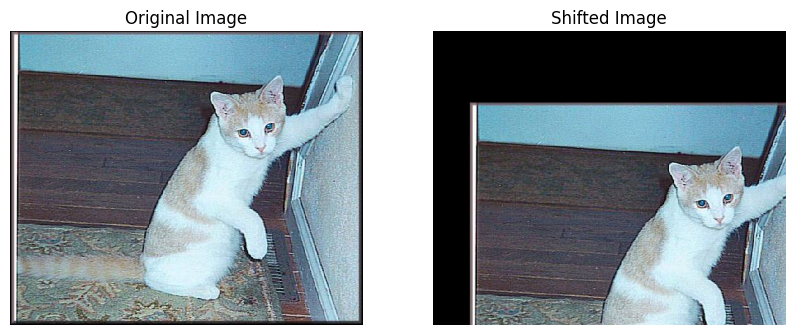

In [38]:
img = cv.imread(img_paths[0])

# Transformation values
translationX, translationY = 50, 100

# Transformation Matrix
transformation_matrix = np.float32([[1, 0, translationX],
                          [0, 1, translationY]])

# Apply transformation to the image
shifted_img = cv.warpAffine(img, transformation_matrix,
                            (img.shape[1], img.shape[0]))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[1].imshow(cv.cvtColor(shifted_img, cv.COLOR_BGR2RGB))
ax[1].set_title("Shifted Image")
ax[0].axis('off')
ax[1].axis('off')
plt.show()

### Image Resizing

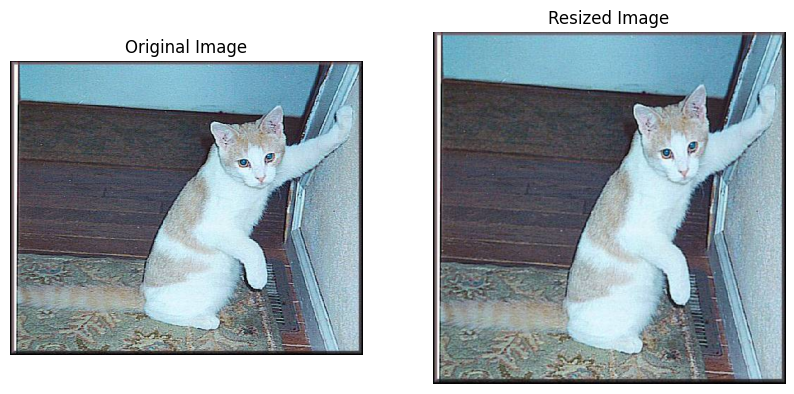

In [39]:
new_width = 500
new_height = 500

img = cv.imread(img_paths[0])

height, width, _ = img.shape

# Scale factor for resizing
scale_x = new_width / width
scale_y = new_height / height

resized_img = cv.resize(img, (new_width, new_height))

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title("Original Image")
axs[1].imshow(cv.cvtColor(resized_img, cv.COLOR_BGR2RGB))
axs[1].set_title("Resized Image")
axs[0].axis('off')
axs[1].axis('off')
plt.show()

### Image Flipping

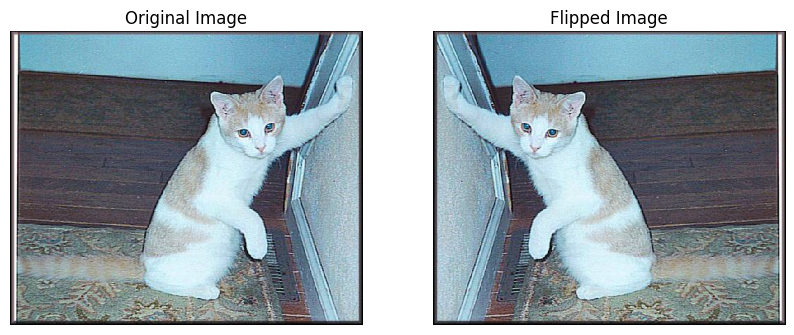

In [40]:
img = cv.imread(img_paths[0])

flipped_img = cv.flip(img, 1)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title("Original Image")
axs[1].imshow(cv.cvtColor(flipped_img, cv.COLOR_BGR2RGB))
axs[1].set_title("Flipped Image")
axs[0].axis('off')
axs[1].axis('off')
plt.show()

### Image Cropping

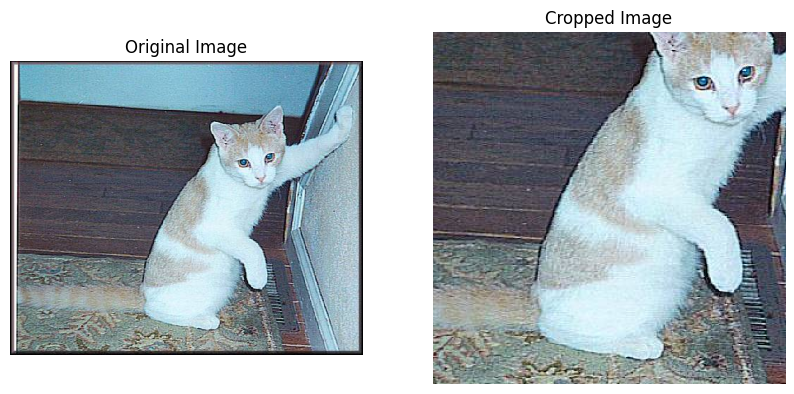

In [41]:
img = cv.imread(img_paths[0])

# Cropping coordinates
x1, y1 = 100, 100
x2, y2 = 400, 400

cropped_img = img[y1:y2, x1:x2]

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[1].imshow(cv.cvtColor(cropped_img, cv.COLOR_BGR2RGB))
ax[1].set_title("Cropped Image")
ax[0].axis('off')
ax[1].axis('off')
plt.show()


## Morphological Operations

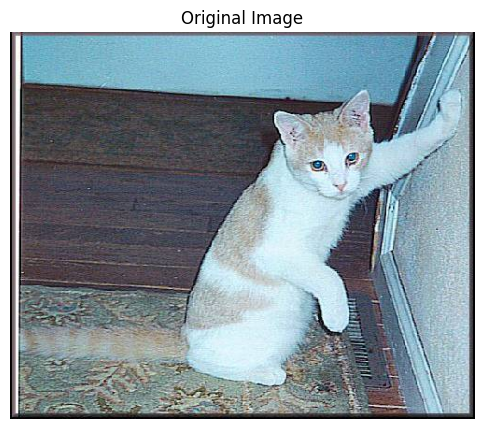

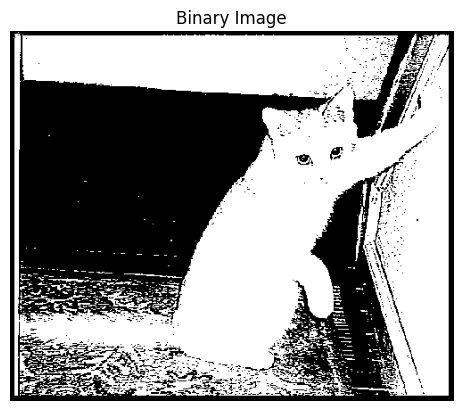

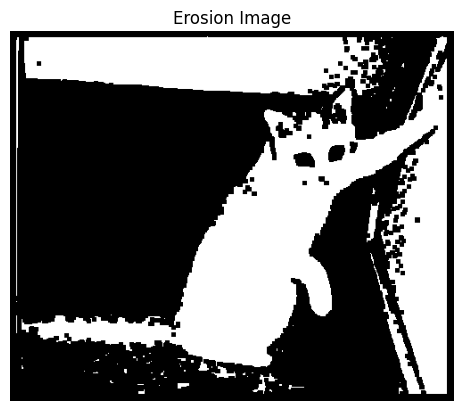

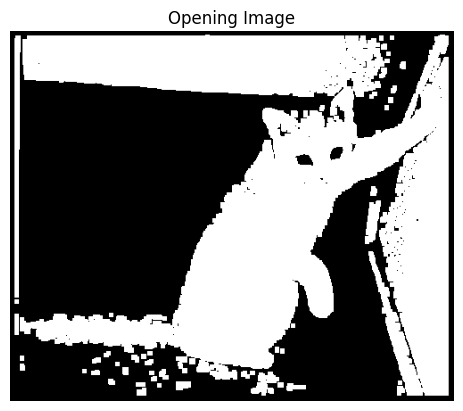

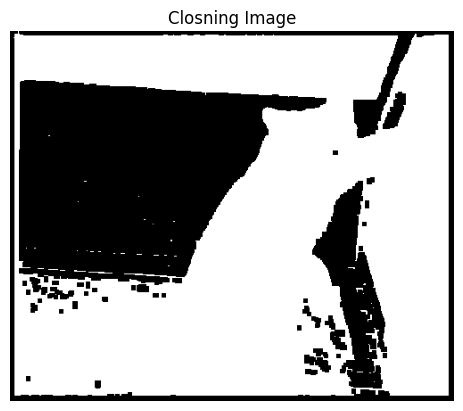

In [42]:
img = cv.imread(img_paths[0])
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply binary thresholding to obtain binary image
ret, binary = cv.threshold(gray, 127, 255, cv.THRESH_BINARY)

# Structuring element
kernel = np.ones((5, 5), np.uint8)

# Morphological Operations:
dilation = cv.dilate(binary, kernel, iterations=1)
erosion = cv.erode(binary, kernel, iterations=1)
opening = cv.morphologyEx(binary, cv.MORPH_OPEN, kernel)
closing = cv.morphologyEx(binary, cv.MORPH_CLOSE, kernel)

fig = plt.figure(figsize=(6, 6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.show()

plt.imshow(binary, cmap="gray")
plt.title("Binary Image")
plt.axis("off")
plt.show()

plt.imshow(erosion, cmap="gray")
plt.title("Erosion Image")
plt.axis("off")
plt.show()

plt.imshow(opening, cmap="gray")
plt.title("Opening Image")
plt.axis("off")
plt.show()

plt.imshow(closing, cmap="gray")
plt.title("Closning Image")
plt.axis("off")
plt.show()




## Image Bitwise Logical Operations

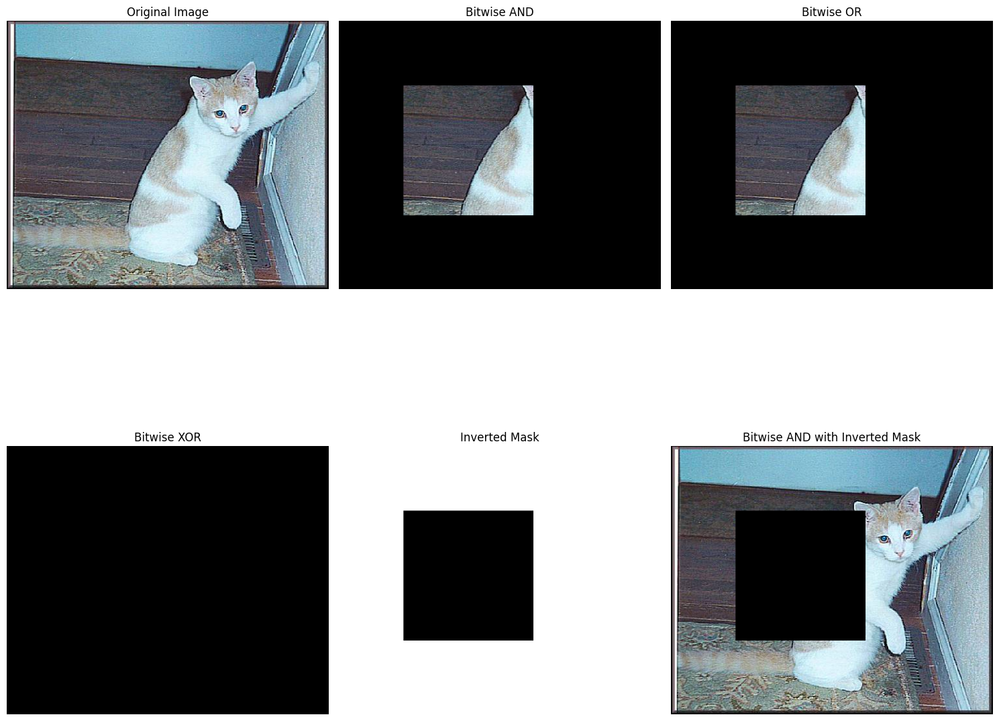

In [43]:
img = cv.imread(img_paths[0])

# mask: a simple rectangle
mask = np.zeros(img.shape[:2], dtype=np.uint8)
cv.rectangle(mask, (100, 100), (300, 300), (255, 255, 255), -1)

masked_and = cv.bitwise_and(img, img, mask=mask)
masked_or = cv.bitwise_or(img, img, mask=mask)
masked_xor = cv.bitwise_xor(img, img, mask=mask)

inverted_mask = cv.bitwise_not(mask)

masked_and_inv = cv.bitwise_and(img, img, mask=inverted_mask)

plt.figure(figsize=(15,15))
plt.subplot(231)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(232)
plt.imshow(cv.cvtColor(masked_and, cv.COLOR_BGR2RGB))
plt.title('Bitwise AND')
plt.axis('off')

plt.subplot(233)
plt.imshow(cv.cvtColor(masked_or, cv.COLOR_BGR2RGB))
plt.title('Bitwise OR')
plt.axis('off')

plt.subplot(234)
plt.imshow(cv.cvtColor(masked_xor, cv.COLOR_BGR2RGB))
plt.title('Bitwise XOR')
plt.axis('off')

plt.subplot(235)
plt.imshow(cv.cvtColor(inverted_mask, cv.COLOR_BGR2RGB))
plt.title('Inverted Mask')
plt.axis('off')

plt.subplot(236)
plt.imshow(cv.cvtColor(masked_and_inv, cv.COLOR_BGR2RGB))
plt.title('Bitwise AND with Inverted Mask')
plt.axis('off')

plt.tight_layout()
plt.show()